# Uczenie maszynowe - regresja liniowa wielu zmiennych

Stwórz model regresji liniowej dla cen mieszkań w Poznaniu. Zestaw danych to 5000 aktualnych opisów z serwisu _gratka.pl_.

Miarą błędu na danych testowych będzie średnia kwadratowa błędu (_Root Mean Squared Error, RMSE_) dla cen mieszkań:

$$ RMSE = \sqrt{\frac{1}{n}\sum_{i=1}^n\left(y_i-\hat{y}_i\,\right)^2} $$

## Dane

Plik `gratkapl.csv` zawiera dane, na których należy zbudować model regresyjny.
Pierwszy wiersz w pliku to nagłówek zawierający opisy kolumn.

* Id - numer porządkowy oferty
* Expected - cena mieszkania
* Rooms - liczba pokoi
* SqrMeters - metraż mieszkania w $m^2$
* Floor - piętro
* Location - dzielnica lub adres w Poznaniu
* Description - fragment opisu mieszkania

## Zadania:

1. Dokonaj analizy fragmentu danych treningowych:
    1. Dla pierwszych 500 mieszkań stwórz wykres złożony z trzech umieszczonych obok siebie wykresów punktowych ilustrujących po kolei korelację cech liczby pokoi, metrażu i piętra mieszkania z ceną mieszkań. Zadbaj o poprawne tytuły na osiach.
    1. W trzech zdaniach opisz wnioski (użyj komórki typu `markdown`).
    1. Powyższe dane są danymi rzeczywistymi, dlatego mogą zawierać szum w postaci odstających punktów (może być widoczny dopiero na większej liczbie danych). Opisz czy wystąpiły jakieś błędne dane, jeżeli tak, to jak wpływają na zależności cech oraz jak je usunięto.

2. Oblicz RMSE na części dostępnych danych:
    1. Podziel dane na dwie części, po 4000 i 1000 elementów.
    1. Za pomocą wybranej metody optymalizacyjnej zbuduj model regresyjny (korzystając z trzech cech liczbowych) dla pierwszej większej cześci danych.
    1. Zastosuj tak stworzony model (parametry $\theta$) do drugiej mniejszej części danych i oblicz dla nich RMSE. Eksperymentuj z doborem wartości $\alpha$ i $\epsilon$.
    
3. Dla tego samego podziału danych uzyskaj jak najmniejszy RMSE, eksperymentując z doborem cech:
    1. Oprócz oczywistych cech numerycznych jak metraż, cechy mogą być symbolicznymi cechami opisującymi występowanie wyrazów lub kombinacjami kilku cech. Zaprojektuj co najmniej trzy nowe cechy i krótko je opisz (wykorzystaj komórkę typu `markdown`). 
    1. Dla pierwszej części danych z poprzedniego zadania wyciągnij/oblicz nowe cechy, tj. do macierzy z danymi dodaj nowe kolumny dla nowych cech.
    1. Stwórz model regresyjny na podziale danych z poprzedniego zadania, wykorzystujący dodatkowo nowe cechy. Oblicz nowy RMSE i porównaj go z poprzednim wynikiem. Eksperymentuj z doborem wartości $\alpha$ i $\epsilon$. Krótko opisz wyniki. Które cechy okazały się najbardziej przydatne?

In [48]:
# importy

import numpy as np
import math
import matplotlib
import matplotlib.pyplot as plt
import ipywidgets as widgets
import pandas as pd
from ipywidgets import fixed
from sklearn.cross_validation import train_test_split
from collections import defaultdict
import re

import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

from IPython.display import display, Math, Latex
import csv

In [49]:
# odczytywanie danych, macierz w latexu

def read_from_file(filename):
    return pd.read_csv(filename, encoding='utf8')

def LatexMatrix(matrix):
    ltx = r'\left[\begin{array}'
    m, n = matrix.shape
    ltx += '{' + ("r" * n) + '}'
    for i in range(m):
        ltx += r" & ".join([('%.4f' % j.item()) for j in matrix[i]]) + r" \\ "
    ltx += r'\end{array}\right]'
    return ltx

In [50]:
#rysowanie wykresów

def plot_graph(ax, color, data, price):
    props = dict(alpha=0.5, edgecolors='none')
    ax.grid(True)
    ax.set_xlabel(data['name'])
    ax.set_ylabel(price['name'])

    handler = ax.scatter(data['values'], price['values'], c=color, s=50, **props)
    ax.set_title('Correlation betwen %s and %s' % (data['name'], price['name']))
    
    return handler

def draw_plots(datas, prices):
    fig = plt.figure(figsize=(24,6))
    axes = [fig.add_subplot(131), fig.add_subplot(132), fig.add_subplot(133)]
    handles = []
    colors = ['red', 'green', 'blue']
    
    for ax, color, data in zip(axes, colors, datas):
        handles.append(plot_graph(ax, color, data, prices))
    
    axes[2].legend(handles, [column['name'] for column in datas], bbox_to_anchor=(1.5, 0.5))

def draw_first_500():
    data_frame = read_from_file('gratkapl.csv')
    rooms = { 'name': 'room', 'values': data_frame['Rooms'].values[:500] }
    sqr_meters = { 'name': 'sqr meters', 'values': data_frame['SqrMeters'].values[:500] }
    floors = { 'name': 'floor', 'values': data_frame['Floor'].values[:500] }
    prices = { 'name': 'price', 'values': data_frame['Expected'].values[:500] }
    datas = [rooms, sqr_meters, floors]
    
    draw_plots(datas, prices)
    
def draw_all():
    data_frame = read_from_file('gratkapl.csv')
    rooms = { 'name': 'room', 'values': data_frame['Rooms'] }
    sqr_meters = { 'name': 'sqr meters', 'values': data_frame['SqrMeters'] }
    floors = { 'name': 'floor', 'values': data_frame['Floor'] }
    prices = { 'name': 'price', 'values': data_frame['Expected'] }
    datas = [rooms, sqr_meters, floors]
    
    draw_plots(datas, prices)
    

# Zadanie 1

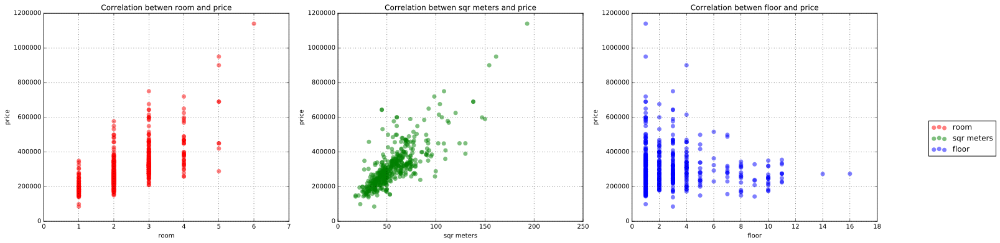

In [51]:
draw_first_500()

Największe zróżnicowanie pomiędzy liczbą pokoi, a ceną występuje w przypadkach mieszkań dwu- i trzypokojowych, a najmniejszy dla sześciopokojowych (brak zróżnicowania, jedna cena). Generalnie można zauważyć wzrost ceny mieszkania wraz ze wzrostem liczby pokoi, ale może to być również spowodowane małą liczbę pokoi wielopokojowych (pięcio-, sześcio-) na wtórnym rynku mieszkań.

Wraz ze wzrostem metrażu mieszkania rośnie jego cena. Zależność tą można z grubsza nazwać liniową. Największe skupisko możemy zauważyć dla mieszkań od 40 do 90 metrów kwadratów, co jest zgodne z polskimi realiami.

Inaczej kwestia wygląda w przypadku piętra, na którym znajduje się mieszkanie: im wyższe piętro tym mniejsze zróżnicowanie w cenie. I tak: za mieszkanie na pierwszym piętrze możemy zapłacić od 180000 do nawet ponad miliona złotych. W przypadku wyższych pięter, na przykład dla piętra 14 i 16 cena wynosi mniej niż 300000 zł. Trudno jednak wnioskować coś więcej na podstawie tych danych, możemy jedynie przypuszczać, że mieszkań na niższych piętrach jest więcej, bo dominują w Polsce niskie bloki.

In [52]:
draw_all()

Szum jest zauważalny gołym okiem: są to pojedyncze wartości, jak np. trzypokojowe mieszkanie, które kosztuje ponad 35000000. Wartości zaszumione to te za bardzo oddalone od średniej wartości, które zaburzałyby wnioskowanie i predykcję. Istnieje wiele statystycznych narzędzi wykrywających, czy coś odstaje od pozostałych wartości, jak np. test Grubbsa. Jednak najprostszą wykorzystywaną metodą, sprawdzającą, czy wartość nie jest zaburzona, to: u - m * s < e < u + m * s, gdzie e jest badaną wartością, u - średnią, a s - odchyleniem standardowym. Parametr m jest tutaj intem, najczęściej stosuje się m=2 lub m=1. Za słusznością wyboru tej metody przemawia statystyka: odchylenie standardowe jest niczym innym, jak miarą rozrzucenia wartości wokół średniej. Chcemy więc pozbyć się tych wartości, które są daleko od średniej.

In [53]:
def reject_outliers(df, key, m=1):
    return df[np.abs(df[key] - df[key].mean()) <= m * df[key].std()]

def get_data_wthout_outliers(df):
    return reject_outliers(df, 'Expected')

def draw_without_outliers():
    data_frame = get_data_wthout_outliers(read_from_file('gratkapl.csv'))
    rooms = { 'name': 'room', 'values': data_frame['Rooms'] }
    sqr_meters = { 'name': 'sqr meters', 'values': data_frame['SqrMeters'] }
    floors = { 'name': 'floor', 'values': data_frame['Floor'] }
    prices = { 'name': 'price', 'values': data_frame['Expected'] }
    datas = [rooms, sqr_meters, floors]
    
    draw_plots(datas, prices)

def check():
    df = reject_outliers(read_from_file('gratkapl.csv'), 'Expected')
    print(df[df['Expected'] < 10000])

In [54]:
draw_without_outliers()

# Zadanie 2

In [55]:
# funkcje regresji

def hMx(theta, X):
    return X*theta

def JMx(theta,X,y):
    m = len(y)
    J = 1.0/(2.0*m)*((X*theta-y).T*(X*theta-y))
    return J.item()

def norm(X,y):
    return (X.T*X)**-1*X.T*y

In [56]:
def create_train_test_sets(df):
    df = get_data_wthout_outliers(df)
    train, test = train_test_split(df, test_size=0.2)
    
    return train, test

def rmse(predictions, targets):
    return np.sqrt(np.mean((predictions - targets)**2)) 

In [57]:
def get_XY(df, labels):
    Xn = df[labels].as_matrix()
    yn = df['Expected'].as_matrix()
    m, n = Xn.shape

    XMx = np.matrix(np.concatenate((np.ones((m, 1)), Xn), axis=1)).reshape(m, n+1)
    yMx = np.matrix(yn).reshape(m, 1)
    
    return XMx, yMx

def train_regression(train, labels):
    XM_train, yM_train = get_XY(train, labels)
    return norm(XM_train, yM_train)

def test_regression(theta, test, labels):
    XMx, expected = get_XY(test, labels)
    predicted = hMx(theta, XMx)
    
    return rmse(np.asarray(predicted), np.asarray(expected))

In [58]:
df = read_from_file('gratkapl.csv')
labels = ['Rooms', 'SqrMeters', 'Floor']
results = []
for i in range(1000):
    train, test = create_train_test_sets(df)
    theta = train_regression(train, labels)
    results.append(test_regression(theta, test, labels))
    
display(Math(r'\Large RMSE = %.4f' % np.min(results)))

# nie ma dużego zaskoczenia - wynik zależy w dużej mierze od tego 
# w jaki sposób dane podzielą się na zbiór treningowy i testowy,
# próbujemy więc 1000 razy i wybieramy najmniejszy wynik :D

# najlepszy uzyskany: RMSE=68005.6493

<IPython.core.display.Math object>

# Zadanie 3

Jak możemy zauważyć, RMSE jest dość wysokie. Sugeruje to, że te dane wejściowe nie są idealnymi kandydatami na regresję liniową. A to dlatego, że - jak można zobaczyć na powyższych wykresach - jedynie korelacja pomiędzy powierzchnią mieszkania, a ceną można nazwać liniową. Intuicja, jaka się nasuwa po zadaniu drugim, jest taka, aby dodać kolejne cechy, które będą miały liniowe zależności.

Propozycja nowych cech:
- średni metraż pokoju (kombinacja cech powierzchni mieszkania i liczby pokoi),
- dzielnica (wyciągnięta z Location) - zakodowane od najtańszej do najdrożśzej według opracowania: https://scontent-waw1-1.xx.fbcdn.net/t31.0-8/14207733_1106338502781385_1758985621682819625_o.jpg (co prawda odnosi się do pokoi dla studentów, ale daje jakiś pogląd na ogólną sytuację),
- występowanie najpopularniejszych słów (wybiorę 100 najpopularniejszych słów z opisów i będę sprawdzał, ile z nich pojawiło się w danym ogłoszeniu),
- abstrakcyjna zmienna: piętro * liczba metrów kwadratowych mieszkania - jedyne co przemawia za słusznością takiej zmiennej jest to, że powinnna mieć liniową zależność,
- kwadrat piętra.

In [59]:
def get_districts(df):
    districts = []
    for line in df['Location']:
        match = re.search(r'Pozna(ń|n) (.*)', line)
        if match:
            sentence = match.group(2)
            if 'ul.' in sentence:
                list = match.group(2).split()
                sentence = ' '.join(list[:list.index('ul.')])
                
            list = sentence.split()
            if len(list) > 1:
                if re.search(r'Nowe|Stare|Górna|Dolna|Stary|Suchy', list[0]):
                    sentence = '%s %s' % (list[0], list[1])
                else:
                    sentence = list[0]
                    
            list = sentence.split('-')
            if len(list) > 1:
                if list[0] == 'Poznań':
                    sentence = list[1]
                    
            list = sentence.split('/')
            if len(list) > 1:
                sentence = list[0]
            
            if sentence:
                districts.append(sentence)
            elif sentence == 'Os.' or sentence == 'Św.':
                districts.append('unk')
            else:
                districts.append('unk')
        else:
            districts.append('unk')
    return districts

def encode_districts(lst):
    encoded_list = []
    districts = {
        'górczyn' : 1,
        'gorczyn' : 1,
        'junikowo' : 2,
        'dębiec' : 3,
        'debiec' : 3,
        'naramowice' : 4,
        'warszawskie' : 5,
        'ogrody' : 6,
        'rataje' : 7,
        'winogrady' : 8,
        'grunwald' : 9,
        'łazarz' : 10,
        'lazarz' : 10,
        'piątkowo' : 11,
        'piatkowo' : 11, 
        'chartowo' : 12,
        'wilda' : 13,
        'górna wilda' : 13,
        'gorna wilda' : 13,
        'dolna wilda' : 13,
        'jeżyce' : 14,
        'jezyce' : 14,
        'jerzyce' : 14, # niestety :(
        'stare miasto' : 15
    }
    for item in lst:
        try:
            encoded_list.append(districts[item.lower()])
        except KeyError:
            encoded_list.append(0)
    
    return encoded_list

def get_100_words(lst):
    word_dict = defaultdict(int)
    for line in lst:
        for word in line.split():
            word = word.strip(',.:;\'"()-?!*/• ').lower()
            word_dict[word] += 1
    
    return [key for key, value in sorted(word_dict.items(), key=lambda item: item[1], reverse=True)][:100]

def get_word_ratio(desc_list, top_words):
    size = len(top_words)
    word_ratio = []
    for desc in desc_list:
        ratio = 0
        for word in desc.split():
            word = word.strip(',.:;\'"()-?!*/• ').lower()
            if word in top_words:
                ratio += 1
        word_ratio.append(ratio/size)
        
    return word_ratio 

def add_avg_meters(df):
    df['SqrMetersPerRoom'] = df['SqrMeters'] / df['Rooms']
    
def add_floor_squared(df):
    df['FloorSquared'] = df['Floor'] ** 2
    
def add_floor_meters(df):
    df['FloorMeters'] = df['Floor'] * df ['SqrMeters']
    
def add_district(df):
    df['District'] = encode_districts(get_districts(df))
    
def add_word_ratio(df):
    top_words = get_100_words(df['Description'])
    df['WordRatio'] = get_word_ratio(df['Description'], top_words)

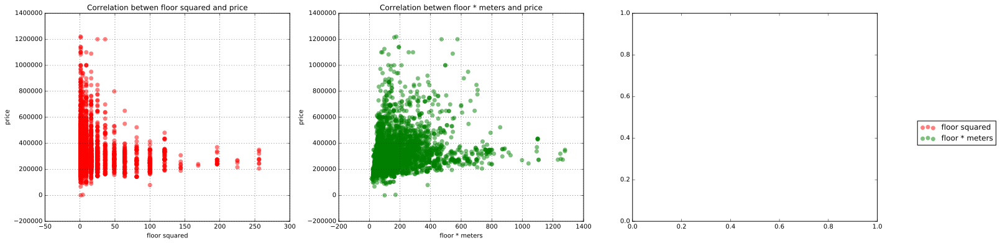

In [60]:
def draw_all_new_features(data_frame):
    data_frame = get_data_wthout_outliers(data_frame)
    district = { 'name': 'district', 'values': data_frame['District'] }
    word_ratio = { 'name': 'word ratio', 'values': data_frame['WordRatio'] }
    avg_meters = { 'name': 'sqr meters per room', 'values': data_frame['SqrMetersPerRoom'] }
    floor_squared = { 'name': 'floor squared', 'values' : data_frame['FloorSquared'] }
    floor_meters = { 'name' : 'floor * meters', 'values' : data_frame['FloorMeters'] }
    prices = { 'name': 'price', 'values': data_frame['Expected'] }
    
    draw_plots([district, word_ratio, avg_meters], prices)
    draw_plots([floor_squared, floor_meters], prices)

df = read_from_file('gratkapl.csv')
add_avg_meters(df)
add_district(df)
add_word_ratio(df)
add_floor_squared(df)
add_floor_meters(df)
draw_all_new_features(df)

In [61]:
df = read_from_file('gratkapl.csv')
add_avg_meters(df)
add_district(df)
add_word_ratio(df)
add_floor_squared(df)
add_floor_meters(df)

# wiem już, że wynik rmse w głównej mierze zależy od tego, jak dane podzielą się na zbiór treningowy i testowy -
# wobec tego, podobnie jak poprzednio powtórzę próbę 1000 razy i wybiorę największą różnicę, jaką udało się uzyskać

differences = []

for _ in range(1000):
    train, test = create_train_test_sets(df)

    old_labels = ['Rooms', 'SqrMeters', 'Floor']
    old_theta = train_regression(train, old_labels)
    old_rmse = test_regression(old_theta, test, old_labels)

    new_labels = ['Rooms', 'SqrMeters', 'Floor', 'SqrMetersPerRoom', 'FloorMeters', 'FloorSquared', 'WordRatio', 'District'] 
    new_theta = train_regression(train, new_labels)
    new_rmse = test_regression(new_theta, test, new_labels)
    
    differences.append((old_rmse, new_rmse, old_rmse - new_rmse))
    
o_rmse, n_rmse, diff = max(differences, key=lambda item: item[2])

display(Math(r'\Large RMSE = %.4f' % o_rmse))
display(Math(r'\Large RMSE = %.4f' % n_rmse))
display(Math(r'\Large difference = %.4f' % diff))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Dodanie nowych cech zmniejszyło RMSE, a więc poprawiło skuteczność regresji. Najwyższa zaobserwowana różnica pomiędzy RMSE przed dodaniem nowych cech i po ich dodaniu wynosiła 1960.5154.

Analiza każdej cechy po kolei (dodanie tylko jednej zmiennej do trzech podstawowych i obserwacja zmian) wykazała, że największą zmianę uzyskuję się poprzez dodanie zmiennej 'WordRatio', najmniejszą natomiast poprzez dodanie zależności średni metraż pokoju * piętro. Obserwacja ta jest zaskakująca: patrząc na wykres zależności tej drugiej cechy do ceny zgadujemy, że stosunkowo łatwo byłoby nakreślić linię prostą - dlatego też sądziłem, że będzie dobrze modelowała regresję liniową.